In [397]:
import matplotlib.pyplot as plt

import geopandas as gpd

pyromes_file = '/home/rpdemilt/SIG/fuels/fuelex/data/geo/RDS-2020-0020/Data/Pyromes_CONUS_20200206.shp'
ff_tiles_file = '/home/rpdemilt/SIG/fuels/fuelex/data/geo/utils_tiles48km_polygons_firefactor.gpkg'
superzones_file = '/home/rpdemilt/SIG/fuels/fuelex/data/geo/conus_landfire_zones_zones/us_lf_zones.shp'

In [398]:
superzones = {
    'Northwest':[1,2,7,8,9],
    'Pacific South':[3,4,5,6],
    'Great Basin': [12,13,16,17,18],
    'Northern Rockies':[10,19,20,21,22],
    'Southwest':[14,15,23,24,28],
    'Northern Plains':[29,30,31,33,38,39,40,42,43],
    'South Central West':[25,26,27,32,34,35,36],
    'South Central East':[37,44,45,98],
    'Great Lakes':[41,49,50,51,52,62],
    'Southern Appalachians':[47,48,53,54,57,59],
    'Southeast':[46,55,56,58,99],
    'Northeast':[60,61,63,64,65,66]
}
zone_to_superzone_map = dict([(v_prime,k) for (k,v) in superzones.items() for v_prime in v ])

def map_superzone(zone):
    return zone_to_superzone_map[zone]
    

In [399]:
superzones = gpd.read_file(superzones_file)
superzones['superzone'] = superzones['ZONE_NUM'].map(lambda x: zone_to_superzone_map[x])


In [400]:
parquet_file = '/home/rpdemilt/SIG/fuels/fuelex/tmp/cache/aef_index_stac_geoparquet.parquet'

aef_parquet_index = gpd.read_parquet(parquet_file)
aef_parquet_index = aef_parquet_index[aef_parquet_index.datetime.dt.year==2025]

In [401]:
splits = aef_parquet_index.iloc[0]['assets']['data']['href'].split('/')
splits.pop(2)
sep = '/'.join(splits)
sep

's3://tge-labs/aef/v1/annual/2025/60S/xvgrhe5lok1ls1sti-0000000000-0000000000.tiff'

In [402]:
from fuelex.utils import union,grid_bounds,partition

<Axes: >

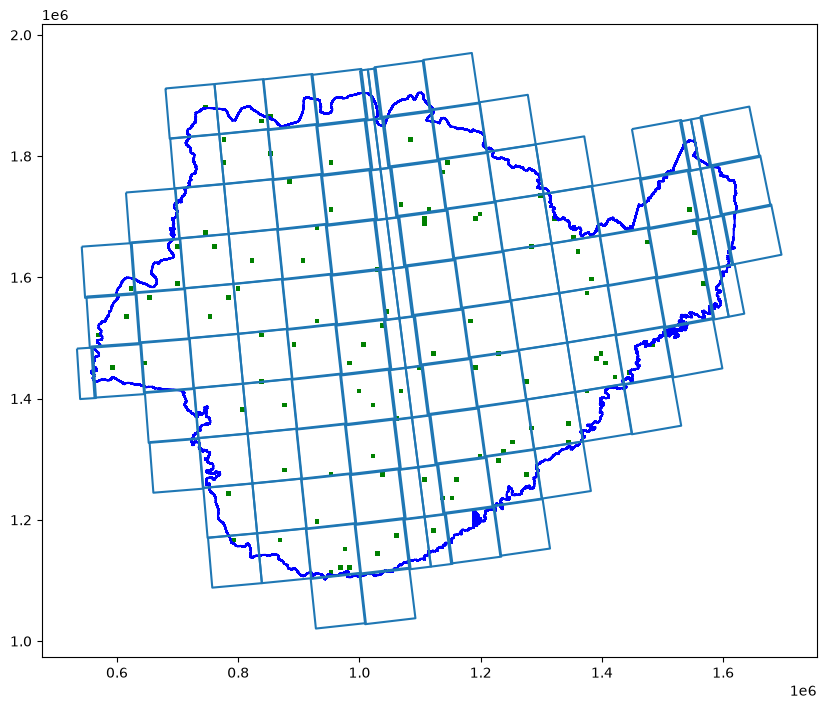

In [403]:
example_superzone = 'Southern Appalachians'

meter_crs = 'EPSG:5070'

southern_appalachian_superzone = superzones.to_crs(meter_crs).query('superzone == @example_superzone')
example_geometry = union(southern_appalachian_superzone.geometry)

pixels = 256
gsd = 30

grid_size = pixels * gsd
example_grid = partition(example_geometry.iloc[0],grid_size)
grid_series = gpd.GeoSeries(example_grid)
fig, ax = plt.subplots(figsize=(10,10))
example_geometry.boundary.plot(ax=ax,color='b')
sample = grid_series.sample(n=100)
# grid_series.boundary.plot(ax=ax,color='r')
sample.plot(ax=ax,color='g')

overlapping_aef_tiles = aef_parquet_index[aef_parquet_index.to_crs('EPSG:5070').intersects(example_geometry.set_crs('EPSG:5070').geometry.iloc[0])]
overlapping_aef_tiles.boundary.to_crs('EPSG:5070').plot(ax=ax)


# grid = partition()
# example_geometry.boundary.plot()

In [404]:
aef_parquet_index

,type,stac_version,id,proj:epsg,datetime,links,assets,collection,bbox,geometry
0,Feature,1.1.0,302450,EPSG:32760,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': 178.53936224933943, 'ymin': -17.77601...","POLYGON ((179.31797 -17.77602, 179.31797 -17.0..."
9,Feature,1.1.0,302449,EPSG:32760,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': 178.5455729396973, 'ymin': -18.516179...","POLYGON ((179.32775 -18.51618, 179.32775 -17.7..."
34,Feature,1.1.0,302458,EPSG:32760,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': 179.31797334938102, 'ymin': -18.50822...","POLYGON ((180 -18.50822, 180 -17.75914, 179.31..."
35,Feature,1.1.0,302459,EPSG:32760,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': 179.30866447593698, 'ymin': -17.76839...","POLYGON ((180 -17.7684, 180 -17.01949, 179.308..."
37,Feature,1.1.0,301411,EPSG:32759,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': 171.75211517761895, 'ymin': -12.59656...","POLYGON ((172.50829 -12.59657, 172.50829 -11.8..."
...,...,...,...,...,...,...,...,...,...,...
302437,Feature,1.1.0,203080,EPSG:32701,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': -177.0, 'ymin': -73.08605927249212, '...","POLYGON ((-174.47888 -73.08606, -174.47888 -72..."
302438,Feature,1.1.0,203081,EPSG:32701,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': -177.0, 'ymin': -72.35167850444267, '...","POLYGON ((-174.58047 -72.35168, -174.58047 -71..."
302439,Feature,1.1.0,203060,EPSG:32701,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': -180.0, 'ymin': -81.89510642572743, '...","POLYGON ((-177 -81.89511, -177 -81.14926, -180..."
302440,Feature,1.1.0,203059,EPSG:32701,2025-01-01 00:00:00+00:00,[],{'data': {'href': 's3://us-west-2.opendata.sou...,None,"{'xmin': -180.0, 'ymin': -82.62896703362927, '...","POLYGON ((-177 -82.62897, -177 -81.88411, -180..."


In [405]:
import numpy as np

sample_frame = gpd.GeoDataFrame(geometry=sample,crs='EPSG:5070')
sample_frame['sample_id'] = sample_frame.index
sample_frame = sample_frame.to_crs(aef_parquet_index.crs).sjoin(aef_parquet_index[['id','geometry']],predicate='intersects',how='left')
sample_frame.drop(columns=['index_right'])

,geometry,sample_id,id
1442,"POLYGON ((-86.97158 36.90486, -86.96332 36.973...",1442,34696
8914,"POLYGON ((-78.38723 36.78072, -78.37121 36.848...",8914,39811
3052,"POLYGON ((-85.95951 33.37311, -85.95074 33.441...",3052,34767
127,"POLYGON ((-89.09223 36.63278, -89.08593 36.701...",127,34493
250,"POLYGON ((-88.63323 36.88048, -88.62649 36.948...",250,34547
...,...,...,...
6515,"POLYGON ((-82.91876 34.03654, -82.90725 34.104...",6515,39412
213,"POLYGON ((-88.81197 35.92865, -88.80548 35.997...",213,34492
213,"POLYGON ((-88.81197 35.92865, -88.80548 35.997...",213,34546
2375,"POLYGON ((-86.32706 35.13119, -86.31841 35.199...",2375,34694


In [406]:
import rasterio as rio

rst = rio.open('/home/rpdemilt/SIG/fuels/fuelex/tmp/xvgrhe5lok1ls1sti-0000000000-0000000000.tiff')
rst.transform

Affine(10.0, 0.0, 663840.0,
       0.0, 10.0, 8033920.0)

In [407]:
rst.bounds

BoundingBox(left=663840.0, bottom=8115840.0, right=745760.0, top=8033920.0)

In [408]:
rst.width

8192

In [409]:
sample_frame[sample_frame['sample_id'].duplicated(keep=False)]

,geometry,sample_id,index_right,id
5797,"POLYGON ((-83.681 33.49666, -83.67023 33.56485...",5797,271710,39369
5797,"POLYGON ((-83.681 33.49666, -83.67023 33.56485...",5797,271745,39411
7915,"POLYGON ((-80.63029 37.02094, -80.61625 37.088...",7915,267168,39645
7915,"POLYGON ((-80.63029 37.02094, -80.61625 37.088...",7915,267131,39646
2143,"POLYGON ((-86.10357 38.8346, -86.09428 38.9027...",2143,272008,34774
2143,"POLYGON ((-86.10357 38.8346, -86.09428 38.9027...",2143,271634,34699
6861,"POLYGON ((-82.32263 35.49359, -82.31037 35.561...",6861,273689,39473
6861,"POLYGON ((-82.32263 35.49359, -82.31037 35.561...",6861,273680,39474
5338,"POLYGON ((-83.79524 35.448, -83.7843 35.51604,...",5338,271674,39371
5338,"POLYGON ((-83.79524 35.448, -83.7843 35.51604,...",5338,271709,39413


In [410]:
sample_frame['sample_id'].unique()

array([1442, 8914, 3052,  127,  250, 8273, 1913, 7711, 3349, 6567, 5471,
        447,  157, 3765, 5797, 7915, 8090, 6838, 2143, 3427, 7960, 8116,
       5470, 6861, 2151, 5338,  886,  439, 2797,   17, 4646, 2361, 6916,
       7820, 8978, 2251, 5639, 4971, 1735, 3665, 8023, 8161, 1959, 7535,
       3095, 4323, 1903, 4312, 2519, 3437, 2580, 7270, 6075, 4514, 4456,
       5415, 5187, 7824, 1211, 1193, 5573, 8880, 6448, 3557, 4127, 7389,
       8044, 5962, 1510, 7065, 8199, 4012, 3115,  847, 8544, 6372, 5867,
       6480, 5982, 1253, 5601, 8383, 3809,   53, 8555, 4799, 1295, 7350,
        988, 7290, 1188, 4824, 4395,  820, 4546, 3370, 6515,  213, 2375,
       4931])

In [411]:
tiles = sample_frame[sample_frame['sample_id'] == 6666]
tiles

,geometry,sample_id,index_right,id


In [412]:
for idx,tile in tiles.iterrows():
    print(tile.geometry.bounds)

In [413]:
rst = rio.open('/home/rpdemilt/SIG/fuels/fuelex/data/fuelex_dataset/Northwest/FBFM40_2025_Scence8091.tif')
arr = rst.read(1)
print(arr.shape)

(256, 256)


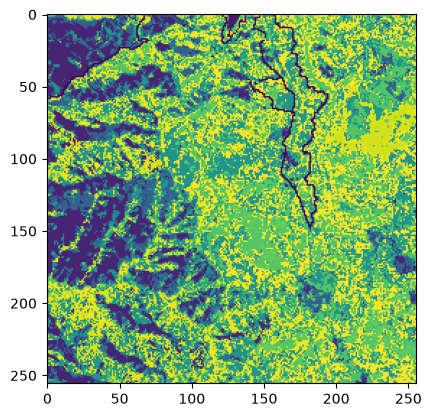

In [414]:
plt.imshow(arr)

In [415]:
rst = rio.open('/home/rpdemilt/SIG/fuels/fuelex/data/fuelex_dataset/Northwest/AEF_2024_Scene8091.tif')
arr = rst.read()
print(arr.shape)

(64, 256, 256)


In [416]:
print(rst.transform)
print(rst.bounds)

| 30.00, 0.00,-1602240.35|
| 0.00,-30.00, 2755350.29|
| 0.00, 0.00, 1.00|
BoundingBox(left=-1602240.3508000013, bottom=2747670.2924000015, right=-1594560.3508000013, top=2755350.2924000015)


In [417]:
test_rst = rio.open('/home/rpdemilt/SIG/fuels/fuelex/tmp/cache/x0teasws6mngznuuo-0000000000-0000008192.tiff')
print(test_rst.transform)
print(test_rst.bounds)

| 10.00, 0.00, 254240.00|
| 0.00, 10.00, 5242880.00|
| 0.00, 0.00, 1.00|
BoundingBox(left=254240.0, bottom=5324800.0, right=336160.0, top=5242880.0)


In [418]:
rst.bounds

BoundingBox(left=-1602240.3508000013, bottom=2747670.2924000015, right=-1594560.3508000013, top=2755350.2924000015)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-67..73].


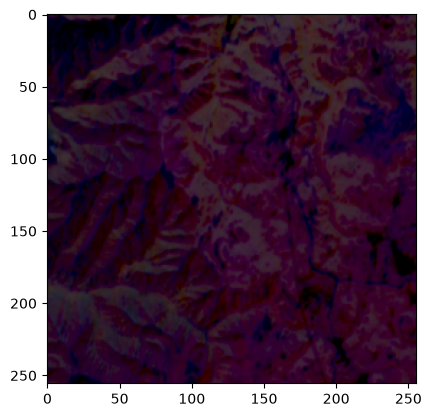

In [419]:
random_3_bands = np.random.uniform(0,65,size=3).astype(int)
plt.imshow(np.transpose(arr[random_3_bands,:,:],(1,2,0)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-65..70].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-52..64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-63..44].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-65..71].
/tmp/ipykernel_175786/1664461376.py:20: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-86..70].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-67..62].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [

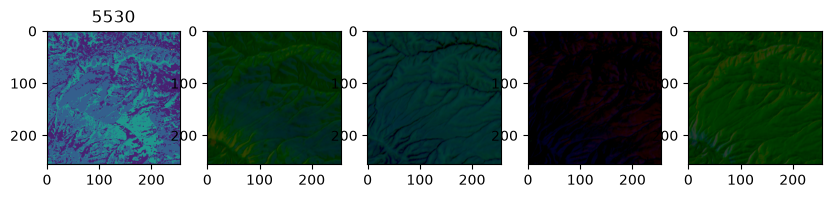

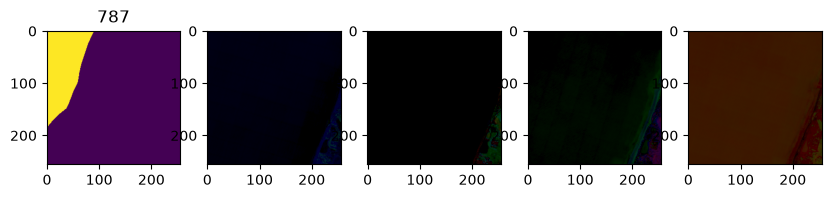

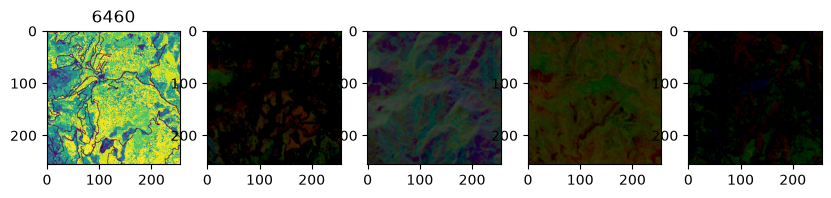

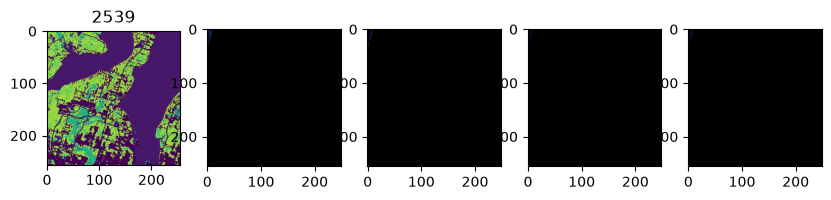

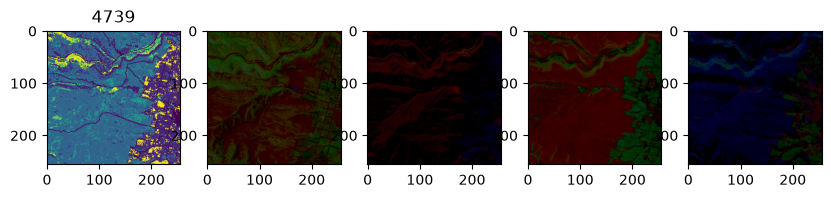

...

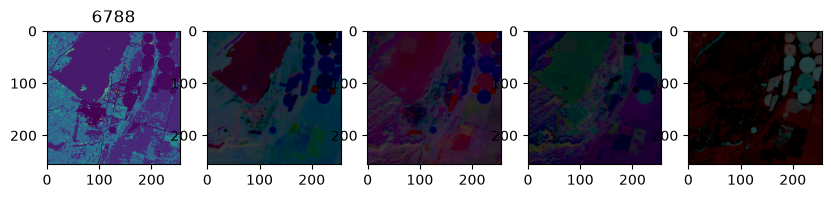

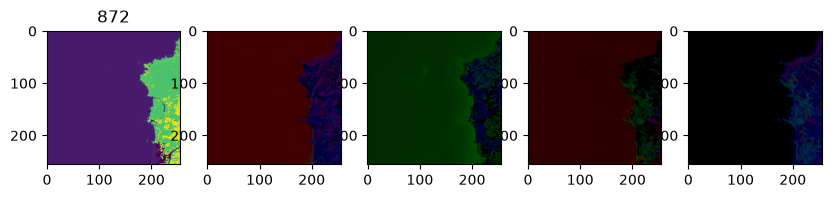

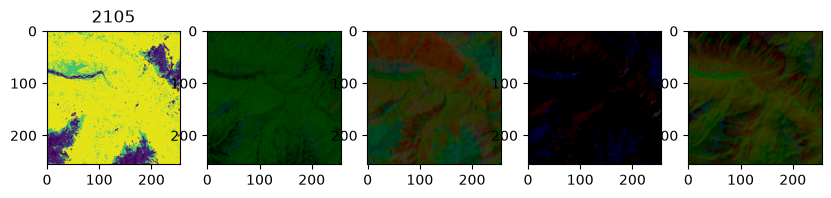

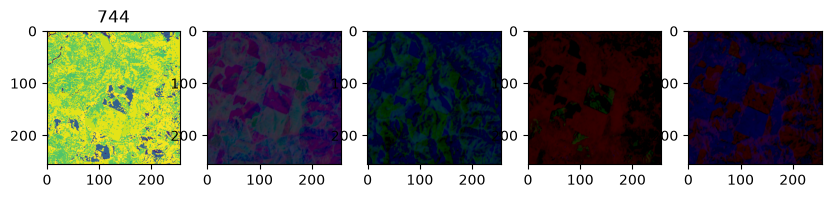

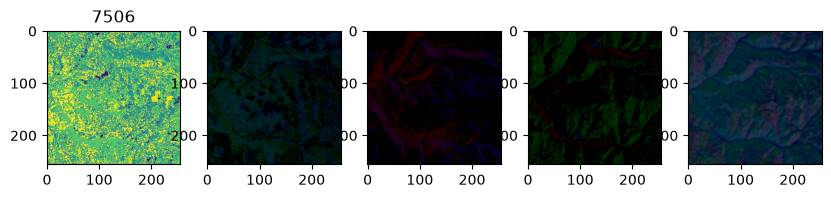

In [ ]:
# from pathlib import Path

# file = Path('/home/rpdemilt/SIG/fuels/fuelex/data/fuelex_dataset/Northwest')
# aef_samples = file.glob('AEF_*')
# for fpath in aef_samples:
#     fig,axs = plt.subplots(ncols=5,nrows=1,figsize=(10,10))

#     scene_id = str(fpath).split('_')[-1][5:-4]
#     fbfm40_path = file / f'FBFM40_2025_Scence{scene_id}.tif'
    

#     fbfm40_arr = rio.open(fbfm40_path).read(1)
#     aef_arr = rio.open(fpath).read()

#     axs[0].imshow(fbfm40_arr)
#     for i in [1,2,3,4]:
#         random_3_bands = np.random.uniform(0,64,size=3).astype(int)
#         axs[i].imshow(np.transpose(aef_arr[random_3_bands,:,:],(1,2,0)),vmin=-126,vmax=128)
#     axs[0].set_title(scene_id)
#     fig.show()
    

In [ ]:
from hydra import initialize, initialize_config_module,compose
from hydra.utils import instantiate
config_path  = '../configs/'
config_name = 'train'

with initialize(config_path=config_path,version_base='1.4'):
    cfg = compose(
        config_name='train.yaml',
        overrides=[
                'dataset=aef_fbfm40_Northwest_superzone_dataset_128px',
                'lr_scheduler=multi_step_lr',
                'criterion=cross_entropy',
                'model=seg_unet_resnet34',
                'optimizer=sgd',
                'preprocessing=standard_augs',
                'task=image_segmentation',
            ]
        )

In [6]:
'_'.join(cfg.dataset.groups)

'Northwest'